## Hacer pruebas:

In [234]:
from skimage.measure import find_contours
import matplotlib.pyplot as plt
import numpy as np
from torchviz import make_dot
import torch
import cv2


In [235]:
# Mi libreria:
%load_ext autoreload
%autoreload 2
from processLIDC import Patient

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


obteniendo los datos...
realizando inferencia...


No handles with labels found to put in legend.


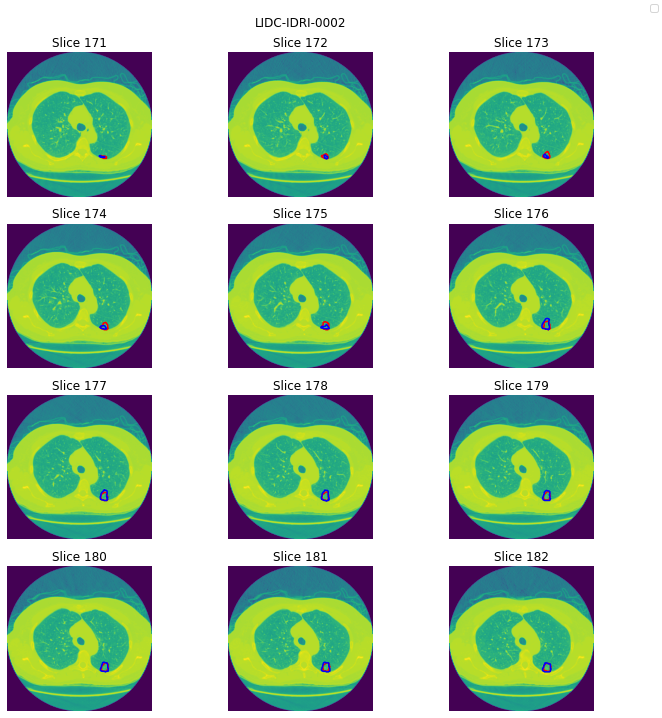

In [236]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#                        in_channels=3, out_channels=1, init_features=32, pretrained=True)
model = torch.jit.load('model_scripted.pt')
model.eval()
patient = Patient("LIDC-IDRI-0002")
patient.scale()
patient.imshow(slices=(171,172,173,174,175,176,177,178,179,180,181,182),
               scaled=True, 
               label=True, 
               model=model, 
               path2save=None)

In [213]:
patient = Patient("LIDC-IDRI-0002")

In [214]:
metodos = [m for m in dir(patient) if not '__' in m]
print(metodos) 

['get_all_nodules', 'get_mask', 'get_tensors', 'id_patient', 'imgs_scaled', 'imshow', 'mask', 'plot_mask', 'predict', 'reconstruct_body', 'scale', 'scan', 'vol']


In [215]:
patient.get_all_nodules()

Paciente: LIDC-IDRI-0002
___________________________________
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 171
num. slices nodulo: 28
-----------
Paciente del nodulo: LIDC-IDRI-0002
Primera slice con el nodulo 176
num. slices nodulo: 23
-----------
___________________________________


In [216]:
patient.plot_mask()

In [217]:
patient.reconstruct_body(nodulos = False)

117598


In [218]:
params = {'slices': (120,121,122,123), # (180, 185, 190)
          'plot': True,
          'with_mask': True}

patient.scale()

obteniendo los datos...


/home/faraujo/TFM/processLIDC/app/processLIDC.py:231: UserWarning:

No contour levels were found within the data range.

/home/faraujo/TFM/processLIDC/app/processLIDC.py:238: UserWarning:

Legend does not support <a list of 1 LineCollection objects> instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists



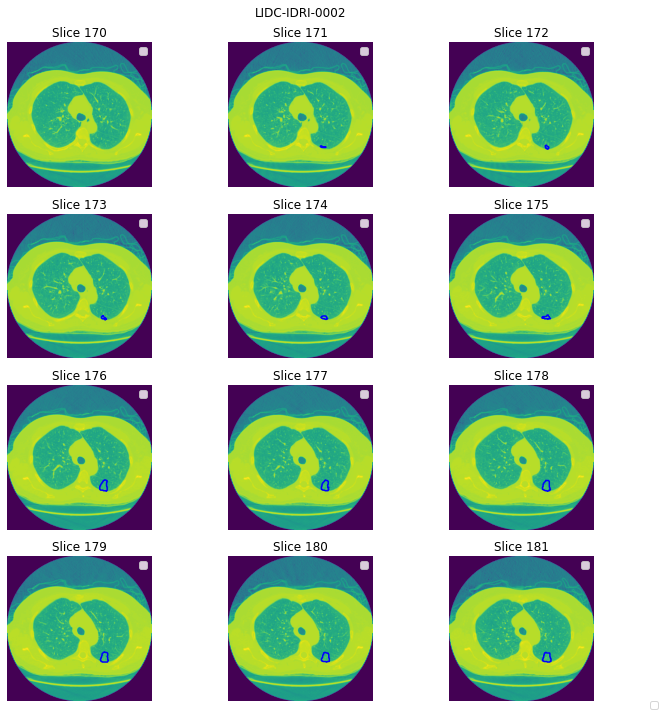

In [219]:
# Mostrar imagenes:

patient.imshow(slices=(170,171,172,173,174,175,176,177,178,179,180,181), scaled=True)

## Inferencia:

obteniendo los datos...
realizando inferencia...


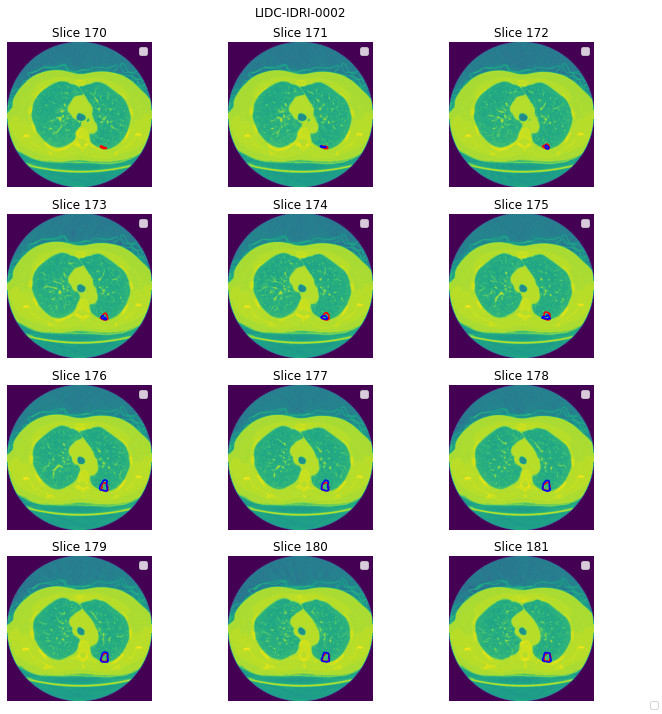

In [220]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#                        in_channels=3, out_channels=1, init_features=32, pretrained=True)
model = torch.jit.load('model_scripted.pt')
model.eval()
patient = Patient("LIDC-IDRI-0002")
patient.scale()
patient.imshow(slices=(170,171,172,173,174,175,176,177,178,179,180,181),
               scaled=True, 
               label=True, 
               model=model, 
               path2save=None)

## Inferencia fuera de la clase Patient (mas laboriosa).

Vale para sacar el graphviz del modelo

In [163]:
# # vuelvo a instanciar:
# patient = Patient("LIDC-IDRI-0002")
# patient.scale()

1. Descargar el modelo, UNET. Entrenada con imagenes del cerebro.

In [164]:
# model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
#                        in_channels=3, out_channels=1, init_features=32, pretrained=True)

Inspeccionemos el modelo:

In [165]:
# print(model)
# print(dir(model))

2. Obtener los tensores para pytorch (imagenes)

In [166]:
# imgs, mask = patient.get_tensors(scaled=True)

In [167]:
# print(imgs.shape)
# print(imgs[0].shape)

3. Seleccionar imagenes para hacer inferencia y hacerla:

In [168]:
# # slices:
# primera = 80
# ultima = 84

# # Predecir:
# pred = model(imgs[primera:ultima])

# # Aprovechamos para obtener un grafico de la red:
# graph = make_dot(pred, params=dict(model.named_parameters()))

# # # Si queremos guardarla en la carpeta
# # graph.render('model', format='png')

# # obtenemos la imagen:
# png_bytes = graph.pipe(format='png')
# # Decodifica los bytes de PNG en un objeto de imagen OpenCV
# nparr = np.frombuffer(png_bytes, np.uint8)
# imagen = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
# plt.imshow(imagen)
# plt.show()


# # graph.render('model', format='png')
# pred = torch.round(pred).detach().numpy()

In [169]:
# pred.shape

Veamos qué ha salido:

In [170]:
# plt.imshow(pred[0].reshape(256,-1))
# plt.show()

Es binaria la mascara predicha? Si, aunque preferiria un mapa de calor siendo proximo a 1 donde sea tumor y 0 donde no lo sea.

In [171]:
# h = pred[0].reshape(-1)
# plt.hist(h, bins = 100)
# plt.title('es binario??')
# plt.show()

In [172]:
# for k in range(ultima-primera):
    
#     fig, ax = plt.subplots(1, 1, figsize=(5, 5))
#     ax.imshow(imgs[k+primera, 0, :, :], cmap='gray')  # , alpha=0.5)

#     for c in find_contours(pred[k, 0, :, :].astype(float), 0.5):
#         plt.plot(c[:, 1], c[:, 0], '--k', label='Prediction')
#     # plt.savefig(f"slice_pred_{k}.png")
#     #  plt.close()